In [ ]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np

In [3]:
import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

### load MNIST data

In [4]:
from scipy.io import loadmat
train_mnist = loadmat('mnist_train.mat')

In [5]:
data = train_mnist['train_X']
data.shape

(60000, 784)

In [6]:
labels = train_mnist['train_labels']
labels.shape

(60000, 1)

downsample data to 100000

In [7]:
idx = np.random.randint(60000, size=10000)
data = data[idx, :]
labels = labels[idx]
labels = labels[:,0].tolist()

### compute symmetric joint probabilities in the original high-dimensional space

In [9]:
def Hbeta(D, beta):
    P = np.exp(-D * beta)
    sumP = np.sum(P)
    H = np.log(sumP) + beta * np.sum(np.multiply(D, P)) / sumP
    P = P / sumP
    return H, P

def x2p(X, u=15, tol=1e-4, print_iter=2500, max_tries=50, verbose=0):
    # Initialize some variables
    n = X.shape[0]                     # number of instances
    P = np.zeros((n, n))               # empty probability matrix
    beta = np.ones(n)                  # empty precision vector
    logU = np.log(u)                   # log of perplexity (= entropy)
    
    # Compute pairwise distances
    if verbose > 0: print('Computing pairwise distances...')
    sum_X = np.sum(np.square(X), axis=1)
    # note: translating sum_X' from matlab to numpy means using reshape to add a dimension
    D = sum_X + sum_X[:,None] + -2 * X.dot(X.T)

    # Run over all datapoints
    if verbose > 0: print('Computing P-values...')
    for i in range(n):
        
        if verbose > 1 and print_iter and i % print_iter == 0:
            print('Computed P-values {} of {} datapoints...'.format(i, n))
        
        # Set minimum and maximum values for precision
        betamin = float('-inf')
        betamax = float('+inf')
        
        # Compute the Gaussian kernel and entropy for the current precision
        indices = np.concatenate((np.arange(0, i), np.arange(i + 1, n)))
        Di = D[i, indices]
        H, thisP = Hbeta(Di, beta[i])
        
        # Evaluate whether the perplexity is within tolerance
        Hdiff = H - logU
        tries = 0
        while abs(Hdiff) > tol and tries < max_tries:
            
            # If not, increase or decrease precision
            if Hdiff > 0:
                betamin = beta[i]
                if np.isinf(betamax):
                    beta[i] *= 2
                else:
                    beta[i] = (beta[i] + betamax) / 2
            else:
                betamax = beta[i]
                if np.isinf(betamin):
                    beta[i] /= 2
                else:
                    beta[i] = (beta[i] + betamin) / 2
            
            # Recompute the values
            H, thisP = Hbeta(Di, beta[i])
            Hdiff = H - logU
            tries += 1
        
        # Set the final row of P
        P[i, indices] = thisP
        
    if verbose > 0: 
        print('Mean value of sigma: {}'.format(np.mean(np.sqrt(1 / beta))))
        print('Minimum value of sigma: {}'.format(np.min(np.sqrt(1 / beta))))
        print('Maximum value of sigma: {}'.format(np.max(np.sqrt(1 / beta))))
    
    return P, beta

def compute_joint_probabilities(samples, d=2, perplexity=30, tol=1e-5, verbose=0):
    v = d - 1
    
    # Initialize some variables
    n = samples.shape[0]
    
    # Precompute joint probabilities for all batches
    if verbose > 0: print('Precomputing P-values...')
      
    P, beta = x2p(samples, perplexity, tol, verbose=verbose) # compute affinities using fixed perplexity
    P[np.isnan(P)] = 0                                       # make sure we don't have NaN's
    P = (P + P.T) # / 2                                      # make symmetric
    P = P / P.sum()                                          # obtain joint probabilities
    P = np.maximum(P, np.finfo(P.dtype).eps)

    return P

In [10]:
P = compute_joint_probabilities(data, verbose=1 )

In [11]:
np.save('P.npy', P)

### construct the neural network

In [12]:
D_in, fc1, fc2, fc3, D_out = 784, 500, 500, 2000, 3

model = torch.nn.Sequential(
    torch.nn.Linear(D_in, fc1), torch.nn.ReLU(),
    torch.nn.Linear(fc1, fc2), torch.nn.ReLU(),
    torch.nn.Linear(fc2, fc3), torch.nn.ReLU(),
    torch.nn.Linear(fc3, D_out)
)

### define t-SNE loss function

In [22]:
def tsne_loss(P, activations):
    n = activations.size(0)
    alpha = 1
    eps = 1e-8
    sum_act = torch.sum(torch.pow(activations, 2), 1)
    Q = sum_act + sum_act.view([-1, 1]) - 2 * torch.matmul(activations, torch.transpose(activations, 0, 1))
    Q = Q / alpha
    Q = torch.pow(1 + Q, -(alpha + 1) / 2)
    Q = Q * autograd.Variable(1 - torch.eye(n), requires_grad=False)
    Q = Q / torch.sum(Q)
    Q = torch.clamp(Q, min=eps)
    print(P.size())
    print(Q.size())
    C = torch.log((P + eps) / (Q + eps))
    C = torch.sum(P * C)
    return C

### prepare mini-batch data

In [18]:
class MyMNISTDataset(object):
    def __init__(self, x, P):
        self.x = x
        self.P = P
    
    def __getitem__(self, idx):
        return self.x[idx], self.y[idx]
    
    def __len__(self):
        return self.x.shape[0]
    

from torch.utils.data import DataLoader

dataset = MyMNISTDataset(data, P)
data_loader = DataLoader(dataset, batch_size=2500, num_workers=0, shuffle=False)

### train the network

In [23]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-2)
for epoch in range(100):      
    for i, batch in enumerate(data_loader):
        x_var = autograd.Variable(batch[0].float())
        y_var = autograd.Variable(batch[1].float())
        y_pred = model(x_var)
        loss = tsne_loss(y_var, y_pred)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

torch.Size([2500, 10000])
torch.Size([2500, 2500])


RuntimeError: inconsistent tensor size, expected r_ [2500 x 10000], t [2500 x 10000] and src [2500 x 2500] to have the same number of elements, but got 25000000, 25000000 and 6250000 elements respectively at /Users/hxiong/Desktop/pytorch/torch/lib/TH/generic/THTensorMath.c:902

### predict the data and visualization

In [220]:
data_var = autograd.Variable(torch.Tensor(data))
data_pro_va = model(data_var)

In [225]:
data_embed = data_pro_va.data.numpy()

In [228]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
print(__version__) # requires version >= 1.9.0
from plotly.graph_objs import *
init_notebook_mode(connected=True)

2.0.8


In [231]:
mot = Scatter3d(
    x=data_embed[:,0],
    y=data_embed[:,1],
    z=data_embed[:,2],
    mode='markers',
    marker=dict(
        size = 3,
        color = 'rgb(150,150,150)'
    )
) 

iplot({
    'data': [mot],
    'layout': Layout(
        width=1000,
        height=1000,
        margin=Margin(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
        )
    )
    },
    show_link=False)

### visulization the network

In [210]:
x_tnsr = torch.Tensor(data)
type(x_tnsr)

torch.FloatTensor

In [212]:
x = autograd.Variable(x_tnsr)
type(x)

torch.autograd.variable.Variable

In [205]:
y_pred = model(x)

In [159]:
from graphviz import Digraph
import torch
from torch.autograd import Variable


def make_dot(var, params=None):
    """ Produces Graphviz representation of PyTorch autograd graph

    Blue nodes are the Variables that require grad, orange are Tensors
    saved for backward in torch.autograd.Function

    Args:
        var: output Variable
        params: dict of (name, Variable) to add names to node that
            require grad (TODO: make optional)
    """
    if params is not None:
        assert isinstance(params.values()[0], Variable)
        param_map = {id(v): k for k, v in params.items()}

    node_attr = dict(style='filled',
                     shape='box',
                     align='left',
                     fontsize='12',
                     ranksep='0.1',
                     height='0.2')
    dot = Digraph(node_attr=node_attr, graph_attr=dict(size="12,12"))
    seen = set()

    def size_to_str(size):
        return '('+(', ').join(['%d' % v for v in size])+')'

    def add_nodes(var):
        if var not in seen:
            if torch.is_tensor(var):
                dot.node(str(id(var)), size_to_str(var.size()), fillcolor='orange')
            elif hasattr(var, 'variable'):
                u = var.variable
                name = param_map[id(u)] if params is not None else ''
                node_name = '%s\n %s' % (name, size_to_str(u.size()))
                dot.node(str(id(var)), node_name, fillcolor='lightblue')
            else:
                dot.node(str(id(var)), str(type(var).__name__))
            seen.add(var)
            if hasattr(var, 'next_functions'):
                for u in var.next_functions:
                    if u[0] is not None:
                        dot.edge(str(id(u[0])), str(id(var)))
                        add_nodes(u[0])
            if hasattr(var, 'saved_tensors'):
                for t in var.saved_tensors:
                    pass
                    dot.edge(str(id(t)), str(id(var)))
                    add_nodes(t)
    add_nodes(var.grad_fn)
    return dot

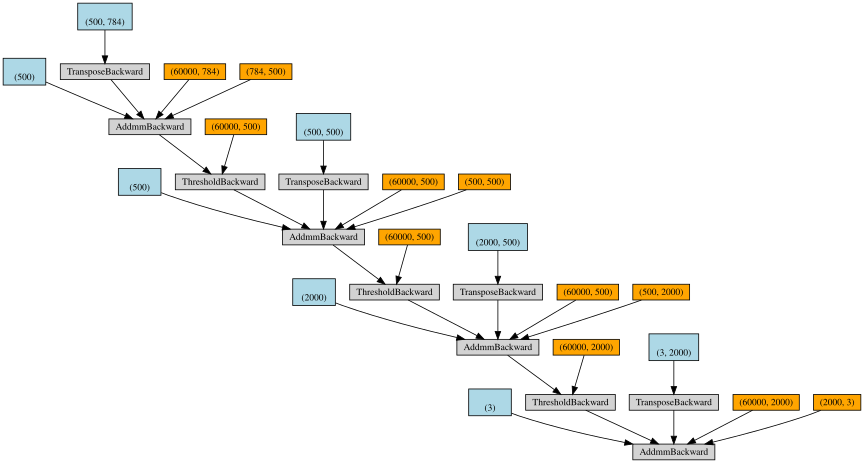

In [160]:
make_dot(y_pred)

In [215]:
for i, batch in enumerate(data_loader):
    x, y = batch
#     print(type(x), type(y))
#     print(x.size(), y.size())
    x_var = autograd.Variable(x.float())
    y_var = autograd.Variable(y.float())
    y_pred = model(x_var)
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11


In [127]:
x = autograd.Variable(torch.rand(5,3))
y = autograd.Variable(torch.rand(5,3))
z = x + y

In [128]:
z.creator

AttributeError: 'Variable' object has no attribute 'creator'

In [36]:
x = torch.rand(5, 3)
print(x)


 0.2976  0.5228  0.2717
 0.7981  0.1206  0.1279
 0.7825  0.2150  0.1564
 0.6082  0.8017  0.3107
 0.4840  0.9581  0.1413
[torch.FloatTensor of size 5x3]



In [47]:
x_t = torch.transpose(x, 0, 1)
x_t


 0.2976  0.7981  0.7825  0.6082  0.4840
 0.5228  0.1206  0.2150  0.8017  0.9581
 0.2717  0.1279  0.1564  0.3107  0.1413
[torch.FloatTensor of size 3x5]

In [54]:
dot_p = torch.matmul(x, x_t)
dot_p


 0.4357  0.3353  0.3878  0.6845  0.6833
 0.3353  0.6679  0.6704  0.6218  0.5199
 0.3878  0.6704  0.6829  0.6969  0.6068
 0.6845  0.6218  0.6969  1.1092  1.1064
 0.6833  0.5199  0.6068  1.1064  1.1722
[torch.FloatTensor of size 5x5]

In [55]:
sum_x + sum_x_t - 2 * dot_p


 1.3128  1.4680  1.4704  1.4436  1.3089
 1.4680  0.7575  0.8597  1.5236  1.5901
 1.4704  0.8597  0.9419  1.4808  1.5236
 1.4436  1.5236  1.4808  1.2229  1.0913
 1.3089  1.5901  1.5236  1.0913  0.8224
[torch.FloatTensor of size 5x5]

In [43]:
sum_x = torch.sum(x, 1)
sum_x


 1.0921
 1.0466
 1.1539
 1.7206
 1.5834
[torch.FloatTensor of size 5]

In [44]:
sum_x_t = sum_x.view([-1, 1])
sum_x_t


 1.0921
 1.0466
 1.1539
 1.7206
 1.5834
[torch.FloatTensor of size 5x1]

In [45]:
sum_x + sum_x_t


 2.1841  2.1387  2.2460  2.8127  2.6754
 2.1387  2.0932  2.2005  2.7672  2.6300
 2.2460  2.2005  2.3078  2.8745  2.7373
 2.8127  2.7672  2.8745  3.4412  3.3040
 2.6754  2.6300  2.7373  3.3040  3.1668
[torch.FloatTensor of size 5x5]

In [37]:
y = x.pow(2)

In [40]:
xx = np.random.randn(5,3)
xx

array([[-2.50012794, -1.22640167, -0.81446661],
       [ 0.96948341,  0.09616873, -0.4705303 ],
       [-0.9061921 , -0.44259913,  0.19639915],
       [ 0.97974426, -1.09530965, -0.54107082],
       [-1.79419994, -0.64490507,  1.12364734]])

In [41]:
yy = np.square(xx)
yy

array([[ 6.2506397 ,  1.50406105,  0.66335586],
       [ 0.93989808,  0.00924842,  0.22139877],
       [ 0.82118413,  0.19589399,  0.03857263],
       [ 0.95989881,  1.19970324,  0.29275763],
       [ 3.21915342,  0.41590255,  1.26258334]])

In [42]:
xx

array([[-2.50012794, -1.22640167, -0.81446661],
       [ 0.96948341,  0.09616873, -0.4705303 ],
       [-0.9061921 , -0.44259913,  0.19639915],
       [ 0.97974426, -1.09530965, -0.54107082],
       [-1.79419994, -0.64490507,  1.12364734]])

In [56]:
sum_x


 1.0921
 1.0466
 1.1539
 1.7206
 1.5834
[torch.FloatTensor of size 5]

In [57]:
Q = sum_x + sum_x.view([-1, 1]) - 2 * torch.matmul(x, torch.transpose(x, 0, 1))

In [59]:
Q = Q/1


 1.3128  1.4680  1.4704  1.4436  1.3089
 1.4680  0.7575  0.8597  1.5236  1.5901
 1.4704  0.8597  0.9419  1.4808  1.5236
 1.4436  1.5236  1.4808  1.2229  1.0913
 1.3089  1.5901  1.5236  1.0913  0.8224
[torch.FloatTensor of size 5x5]

In [61]:
Q = 1 + Q

In [70]:
torch.eye(5)


 1  0  0  0  0
 0  1  0  0  0
 0  0  1  0  0
 0  0  0  1  0
 0  0  0  0  1
[torch.FloatTensor of size 5x5]

In [72]:
zero_dgnl_mat = autograd.Variable(1-torch.eye(5), requires_grad=False)
zero_dgnl_mat

Variable containing:
 0  1  1  1  1
 1  0  1  1  1
 1  1  0  1  1
 1  1  1  0  1
 1  1  1  1  0
[torch.FloatTensor of size 5x5]

In [76]:
Q = autograd.Variable(Q, requires_grad=False)
Q

Variable containing:
 2.3128  2.4680  2.4704  2.4436  2.3089
 2.4680  1.7575  1.8597  2.5236  2.5901
 2.4704  1.8597  1.9419  2.4808  2.5236
 2.4436  2.5236  2.4808  2.2229  2.0913
 2.3089  2.5901  2.5236  2.0913  1.8224
[torch.FloatTensor of size 5x5]

In [78]:
Q = Q * zero_dgnl_mat
Q

Variable containing:
 0.0000  2.4680  2.4704  2.4436  2.3089
 2.4680  0.0000  1.8597  2.5236  2.5901
 2.4704  1.8597  0.0000  2.4808  2.5236
 2.4436  2.5236  2.4808  0.0000  2.0913
 2.3089  2.5901  2.5236  2.0913  0.0000
[torch.FloatTensor of size 5x5]

In [93]:
sum_row = torch.sum(Q, 1)
sum_row

Variable containing:
 1.0249
 0.9907
 0.9772
 1.0050
 1.0022
[torch.FloatTensor of size 5]

In [80]:
Q = Q / sum_row
Q

Variable containing:
 0.0000  0.2614  0.2647  0.2562  0.2427
 0.2547  0.0000  0.1992  0.2645  0.2722
 0.2549  0.1970  0.0000  0.2601  0.2653
 0.2522  0.2673  0.2658  0.0000  0.2198
 0.2382  0.2743  0.2704  0.2192  0.0000
[torch.FloatTensor of size 5x5]

In [100]:
Q.size(0)

5

In [90]:
torch.sum(Q, 0)

Variable containing:
 1.0000
 1.0000
 1.0000
 1.0000
 1.0000
[torch.FloatTensor of size 5]

In [87]:
tst_x = np.random.rand(5,5)
tst_x

array([[ 0.83883826,  0.56122471,  0.80961847,  0.98022598,  0.9134492 ],
       [ 0.86461802,  0.0839184 ,  0.415856  ,  0.09671539,  0.43589492],
       [ 0.90210869,  0.33500608,  0.44111305,  0.5495927 ,  0.55802914],
       [ 0.26455514,  0.23790882,  0.91743497,  0.62991718,  0.48389179],
       [ 0.65505091,  0.11537323,  0.55665203,  0.57175657,  0.16476388]])

In [88]:
tst_v = np.random.rand(5)
tst_v

array([ 0.04734479,  0.75258951,  0.80395799,  0.68955919,  0.04641471])

In [86]:
tst_x / tst_v

ValueError: operands could not be broadcast together with shapes (4,5) (4,) 

In [4]:
x = np. random.rand(5,3)

In [5]:
y = np.random.rand(5,3)

In [6]:
batch = (x, y)

In [8]:
batch[0]

array([[ 0.0084108 ,  0.26476866,  0.65411685],
       [ 0.53240802,  0.41165072,  0.85603664],
       [ 0.52240342,  0.17147026,  0.85808746],
       [ 0.06982013,  0.18344883,  0.56899933],
       [ 0.70524731,  0.66306707,  0.63447858]])